## Analyze surface fields to estimate small scale gradients

We want to address the questions of whether the small scale surface variance/fronts are enhanced in the summer or winter? 

A first guess might be that more fronts are present in the winter because of deeper mixed layers creating small scale flows, which can stir up a lot of fronts. 

However, this is a bit contradictory to turbulence theory, in which a steeper spectra of surface velocity field (less variance at small scales) leads to a flatter spectrum of passive tracers. This would suggest that in winter when there is more kinetic energy at small scales, we might expect a steeper tracer spectrum. 

However, there are further questions about this thinking. Firstly, temperature is not entirely a passive tracer. Secondly, a statement about the spectral slope does not say much about the actual variance at small scales. 

We try to look at what LLC4320 (~1-2km) simulation tells us about this. 

If we see patterns that are similar to obs, then it would suggest that we could focus on understanding the mechanisms that generate the small scale variability using the model fields. 

In [3]:
import dask
dask.config.set({"logging.distributed": "warning"})

In [4]:
# Setup cluster
from dask.distributed import Client, progress
from dask_kubernetes import KubeCluster
cluster = KubeCluster()
cluster.adapt(minimum=1, maximum=20)
client = Client(cluster)
client

distributed.scheduler - INFO - Clear task state
distributed.scheduler - INFO -   Scheduler at:  tcp://10.32.16.135:46667
distributed.scheduler - INFO -   dashboard at:                    :45203
distributed.scheduler - INFO - Receive client connection: Client-883fbffa-9546-11ea-838f-4697c51070d1
distributed.core - INFO - Starting established connection


Client Scheduler: tcp://10.32.16.135:46667 Dashboard: /user/0000-0001-6632-0187/proxy/45203/status,Cluster Workers: 0 Cores: 0 Memory: 0 B


distributed.scheduler - INFO - Register tcp://10.32.87.3:37179
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.87.3:37179
distributed.core - INFO - Starting established connection


In [5]:
import warnings
warnings.filterwarnings('ignore')

In [6]:
# Load some useful modules 
import numpy as np
import xarray as xr
import xrft
import intake
from xmitgcm import llcreader
from matplotlib import pyplot as plt

%matplotlib inline

In [7]:
cat_url = "https://raw.githubusercontent.com/pangeo-data/pangeo-datastore/master/intake-catalogs/ocean/llc4320.yaml"
cat = intake.Catalog(cat_url)

In [8]:
# Get variables from catalog
sst = cat.LLC4320_SST.to_dask()
sss = cat.LLC4320_SSS.to_dask()
ssh = cat.LLC4320_SSH.to_dask()
u = cat.LLC4320_SSU.to_dask()
v = cat.LLC4320_SSV.to_dask()

In [6]:
ds = xr.merge([ssh, sst, sss, u, v])
ds = llcreader.llcmodel.faces_dataset_to_latlon(ds, metric_vector_pairs=[])
ds

,Array,Chunk
Bytes,8.09 TB,74.65 MB
Shape,"(9030, 12960, 17280)","(1, 4320, 4320)"
Count,659191 Tasks,108360 Chunks
Type,float32,numpy.ndarray


In [7]:
coords = cat.LLC4320_grid.to_dask().reset_coords()
coords = llcreader.llcmodel.faces_dataset_to_latlon(coords)

In [29]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [15]:
import xgcm
grid = xgcm.Grid(coords.drop(['k', 'k_p1']), periodic=None)

### Define anomalies and small scale variance

Show how we detect small scale variance.

In [8]:
sel_sogos = np.logical_and(np.logical_and(coords.XC>28, coords.XC<40 ), 
                           np.logical_and(coords.YC>-56, coords.YC<-48 ))

In [9]:
SST_sogos = ds.SST.where(sel_sogos, drop=True)

distributed.scheduler - INFO - Retire worker names (0, 1)
distributed.deploy.adaptive - INFO - Retiring workers [0, 1]
distributed.scheduler - INFO - Remove worker tcp://10.32.13.17:40677
distributed.core - INFO - Removing comms to tcp://10.32.13.17:40677
distributed.scheduler - INFO - Lost all workers
distributed.scheduler - INFO - Register tcp://10.32.5.12:35875
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.5.12:35875
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.17.10:44363
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.17.10:44363
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Retire worker names (2,)
distributed.deploy.adaptive - INFO - Retiring workers [2]
distributed.scheduler - INFO - Remove worker tcp://10.32.5.12:35875
distributed.core - INFO - Removing comms to tcp://10.32.5.12:35875
distributed.scheduler - INFO - 

In [38]:
SST_sogos

,Array,Chunk
Bytes,13.73 GB,1.52 MB
Shape,"(9030, 660, 576)","(1, 660, 576)"
Count,704577 Tasks,9030 Chunks
Type,float32,numpy.ndarray


In [40]:
# area averaged mean, with some time points dropped for faster calc
#SST_sogos_av_monthly = SST_sogos.isel(
#        time=slice(0,9030,15*24)).mean(['i','j'])


In [10]:
SST_sogos_av_monthly = SST_sogos.coarsen(
        time=15*24, boundary='trim').mean().mean(['i','j'])

distributed.scheduler - INFO - Retire worker names (8,)
distributed.deploy.adaptive - INFO - Retiring workers [8]


In [11]:
SST_sogos_av_monthly.load();

distributed.scheduler - INFO - Remove worker tcp://10.32.19.7:40273
distributed.core - INFO - Removing comms to tcp://10.32.19.7:40273
distributed.core - INFO - Event loop was unresponsive in Scheduler for 5.62s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
distributed.scheduler - INFO - Remove worker tcp://10.32.20.13:37963
distributed.core - INFO - Removing comms to tcp://10.32.20.13:37963
distributed.core - INFO - Event loop was unresponsive in Scheduler for 7.85s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
distributed.scheduler - INFO - Register tcp://10.32.8.8:44753
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.8.8:44753
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.43.21:40937
distributed.scheduler - INFO - Starti

In [12]:
lwindow = 40 # do a rolling box avg over 40 grid points 
SST_sogos_ls = (SST_sogos.rolling(i=lwindow, center=True).mean()
                   ).rolling(j=lwindow, center=True).mean()
SST_sogos_ss = SST_sogos - SST_sogos_ls

distributed.scheduler - INFO - Retire worker names (20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38)
distributed.deploy.adaptive - INFO - Retiring workers [20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
distributed.scheduler - INFO - Remove worker tcp://10.32.17.12:34107
distributed.core - INFO - Removing comms to tcp://10.32.17.12:34107
distributed.scheduler - INFO - Remove worker tcp://10.32.27.3:35477
distributed.core - INFO - Removing comms to tcp://10.32.27.3:35477
distributed.scheduler - INFO - Remove worker tcp://10.32.35.8:36039
distributed.core - INFO - Removing comms to tcp://10.32.35.8:36039
distributed.scheduler - INFO - Remove worker tcp://10.32.21.19:39961
distributed.core - INFO - Removing comms to tcp://10.32.21.19:39961
distributed.scheduler - INFO - Remove worker tcp://10.32.25.12:37463
distributed.core - INFO - Removing comms to tcp://10.32.25.12:37463
distributed.scheduler - INFO - Remove worker tcp://10.32.27.

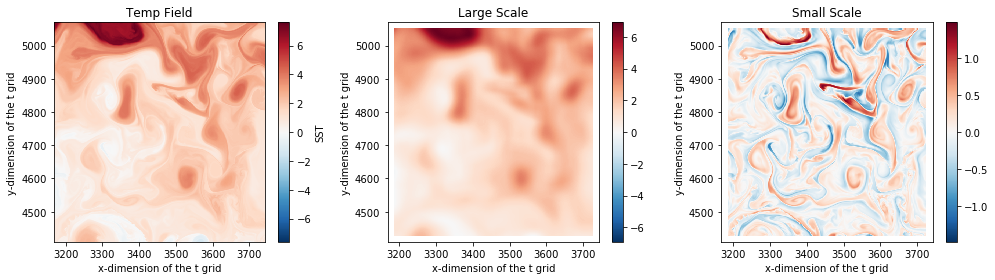

In [13]:
plt.figure(figsize=(14,4))
plt.subplot(131)
SST_sogos.isel(time=0).plot()
plt.title('Temp Field')

plt.subplot(132)
SST_sogos_ls.isel(time=0).plot()
plt.title('Large Scale')

plt.subplot(133)
SST_sogos_ss.isel(time=0).plot()
plt.title('Small Scale')
plt.tight_layout()

plt.savefig('method.png')

In [52]:
# Seasonal cycle of small scale variance
#SST_sogos_ss_monthly = SST_sogos_ss.isel(
#            time=slice(0,9030,15*24)).var(['i','j'])

In [18]:
# Seasonal cycle of small scale variance
SST_sogos_ss_monthly = SST_sogos_ss.isel(
            time=slice(0,9030,15*24)).coarsen(
            time=7*24, boundary='trim').var().var(['i','j'])

In [ ]:
SST_sogos_ss_monthly.load();

distributed.core - INFO - Event loop was unresponsive in Scheduler for 7.57s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
distributed.core - INFO - Event loop was unresponsive in Scheduler for 8.48s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
distributed.core - INFO - Event loop was unresponsive in Scheduler for 8.73s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.


In [ ]:
fig, ax1 = plt.subplots()
SST_sogos_ss_monthly.plot(ax=ax1,color='b')
ax1.set_ylabel('Small Scale T Var', color='b')
ax1.tick_params(axis='y', labelcolor='b')

ax2= ax1.twinx()
SST_sogos_av_monthly.plot(ax=ax2, color='r');
ax2.set_ylabel('Area av temp',color='r')
ax2.tick_params(axis='y', labelcolor='r')

#plt.savefig('method2.png')

## Apply method to larger regions

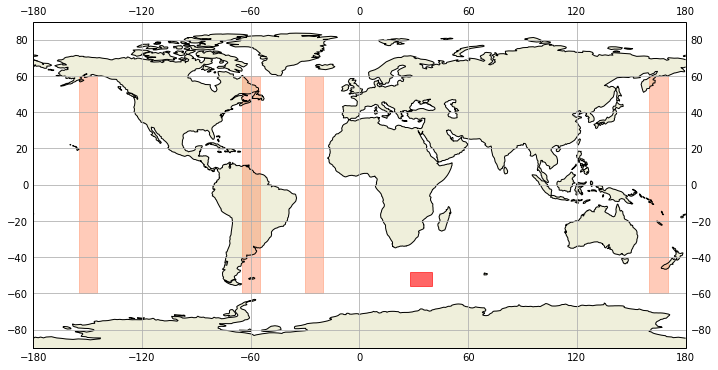

In [138]:
#x, y = [-44, -44, 45, 45, -44], [-45, box_top, box_top, -45, -45]

x_east, y_east = [160, 170, 170, 160, 160], [-60, -60, 60, 60, -60]
x_west, y_west = [-155, -145, -145, -155, -155], [-60, -60, 60, 60, -60]
x_atl_east, y_atl_east = [-30, -20, -20, -30, -30], [-60, -60, 60, 60, -60]
x_atl_west, y_atl_west = [-65, -55, -55, -65, -65], [-60, -60, 60, 60, -60]

x_sogos, y_sogos = [28, 40, 40, 28, 28], [-56, -56, -48, -48, -48]

plt.figure(figsize=(14,6))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()

#ax.plot(x, y, marker='o', transform=ccrs.PlateCarree())
ax.fill(x_east, y_east, color='coral', transform=ccrs.PlateCarree(), alpha=0.4)
ax.fill(x_west, y_west, color='coral', transform=ccrs.PlateCarree(), alpha=0.4)

ax.fill(x_atl_east, y_atl_east, color='coral', transform=ccrs.PlateCarree(), alpha=0.4)
ax.fill(x_atl_west, y_atl_west, color='coral', transform=ccrs.PlateCarree(), alpha=0.4)

ax.fill(x_sogos, y_sogos, color='red', transform=ccrs.PlateCarree(), alpha=0.6)


ax.coastlines()
ax.set_boundary
ax.add_feature(cfeature.LAND)
ax.gridlines(draw_labels=True);

plt.savefig('regions.png')

#### Pacific

x_east, y_east = [160, 170, 170, 160, 160], [-60, -60, 60, 60, -60]  
x_west, y_west = [-155, -145, -145, -155, -155], [-60, -60, 60, 60, -60]

In [80]:
sel_Pac_strip_west = np.logical_and(np.logical_and(coords.XC>160, coords.XC<170 ),
                           np.logical_and(coords.YC>-60, coords.YC<60 ))
sel_Pac_strip_east = np.logical_and(np.logical_and(coords.XC>-155, coords.XC<-145 ),
                           np.logical_and(coords.YC>-60, coords.YC<60 ))

In [81]:
# Pacific Strip 
SST_Pac_strip_west = ds.SST.where(sel_Pac_strip_west, drop=True)
SST_Pac_strip_east = ds.SST.where(sel_Pac_strip_east, drop=True)

distributed.scheduler - INFO - Retire worker names (40, 41)
distributed.deploy.adaptive - INFO - Retiring workers [40, 41]
distributed.scheduler - INFO - Register tcp://10.32.22.16:36603
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.22.16:36603
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.23.8:34893
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.23.8:34893
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Retire worker names (31,)
distributed.deploy.adaptive - INFO - Retiring workers [31]
distributed.scheduler - INFO - Remove worker tcp://10.32.23.5:38741
distributed.core - INFO - Removing comms to tcp://10.32.23.5:38741
distributed.scheduler - INFO - Retire worker names (41,)
distributed.deploy.adaptive - INFO - Retiring workers [41]
distributed.scheduler - INFO - Remove worker tcp://10.32.23.8:34893
distributed.core - INFO - 

In [82]:
SST_Pac_strip_west

,Array,Chunk
Bytes,135.73 GB,8.36 MB
Shape,"(9030, 7764, 484)","(1, 4320, 484)"
Count,740699 Tasks,27090 Chunks
Type,float32,numpy.ndarray


In [83]:
SST_Pac_strip_west_monthly = SST_Pac_strip_west.isel(
    time=slice(0,9030,15*24)).coarsen(j=450, boundary='trim').mean().mean(['i'])
SST_Pac_strip_east_monthly = SST_Pac_strip_east.isel(
    time=slice(0,9030,15*24)).coarsen(j=450, boundary='trim').mean().mean(['i'])

In [85]:
YCmean_Pac_strip_coarse = coords.YC.where(sel_Pac_strip_west, drop=True
                                         ).coarsen(j=450, boundary='trim').mean().mean(['i'])

distributed.scheduler - INFO - Retire worker names (65,)
distributed.deploy.adaptive - INFO - Retiring workers [65]
distributed.scheduler - INFO - Retire worker names (66, 67)
distributed.deploy.adaptive - INFO - Retiring workers [66, 67]
distributed.scheduler - INFO - Register tcp://10.32.23.14:38091
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.23.14:38091
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.23.15:37641
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.23.15:37641
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Retire worker names (68,)
distributed.deploy.adaptive - INFO - Retiring workers [68]
distributed.scheduler - INFO - Remove worker tcp://10.32.23.15:37641
distributed.core - INFO - Removing comms to tcp://10.32.23.15:37641
distributed.scheduler - ERROR - Couldn't gather keys {"('logical_and-72709b831a659921e0b28

In [88]:
YCmean_Pac_strip_coarse.load()

distributed.scheduler - INFO - Register tcp://10.32.15.5:41913
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.15.5:41913
distributed.core - INFO - Starting established connection


<xarray.DataArray (j: 17)>
array([-57.593563 , -52.436527 , -46.722225 , -40.411068 , -33.50311  ,
       -26.028343 , -18.053455 ,  -9.684051 ,  -1.0619241,   7.5935664,
        16.039183 ,  24.12173  ,  31.72638  ,  38.776978 ,  45.235065 ,
        51.093918 ,  56.38883  ], dtype=float32)
Coordinates:
  * j        (j) float64 4.264e+03 4.714e+03 5.164e+03 ... 1.101e+04 1.146e+04

In [84]:
SST_Pac_strip_west_monthly.load();
SST_Pac_strip_east_monthly.load();

distributed.scheduler - INFO - Register tcp://10.32.23.10:45045
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.23.10:45045
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.23.9:45853
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.23.9:45853
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Retire worker names (39, 41, 42, 43, 44)
distributed.deploy.adaptive - INFO - Retiring workers [39, 41, 42, 43, 44]
distributed.scheduler - INFO - Remove worker tcp://10.32.23.9:45853
distributed.core - INFO - Removing comms to tcp://10.32.23.9:45853
distributed.scheduler - INFO - Remove worker tcp://10.32.22.16:36603
distributed.core - INFO - Removing comms to tcp://10.32.22.16:36603
distributed.scheduler - INFO - Retire worker names (45, 46, 47, 48, 49, 50, 51)
distributed.deploy.adaptive - INFO - Retiring workers [45, 46, 47, 48, 49, 50, 51]
di

KilledWorker: ("('getitem-zarr-concatenate-ffa22bca6a252e338836d8ee7f9bbc47', 7200, 0, 0, 0)", <Worker 'tcp://10.32.22.17:41021', memory: 0, processing: 11>)

distributed.scheduler - INFO - Retire worker names (57, 58, 59, 60)
distributed.deploy.adaptive - INFO - Retiring workers [57, 58, 59, 60]
distributed.scheduler - INFO - Remove worker tcp://10.32.23.11:34795
distributed.core - INFO - Removing comms to tcp://10.32.23.11:34795
distributed.scheduler - INFO - Retire worker names (61, 62)
distributed.deploy.adaptive - INFO - Retiring workers [61, 62]
distributed.scheduler - INFO - Remove worker tcp://10.32.23.12:43899
distributed.core - INFO - Removing comms to tcp://10.32.23.12:43899
distributed.scheduler - INFO - Lost all workers
distributed.scheduler - INFO - Register tcp://10.32.23.13:45475
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.23.13:45475
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.22.18:33443
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.22.18:33443
distributed.core - INFO - Starting established connectio

distributed.scheduler - INFO - Register tcp://10.32.13.6:39475
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.13.6:39475
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.14.7:40515
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.14.7:40515
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.9.11:45437
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.9.11:45437
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.23.23:37529
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.23.23:37529
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.23.24:42445
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.23.24:42445
distributed.core - 

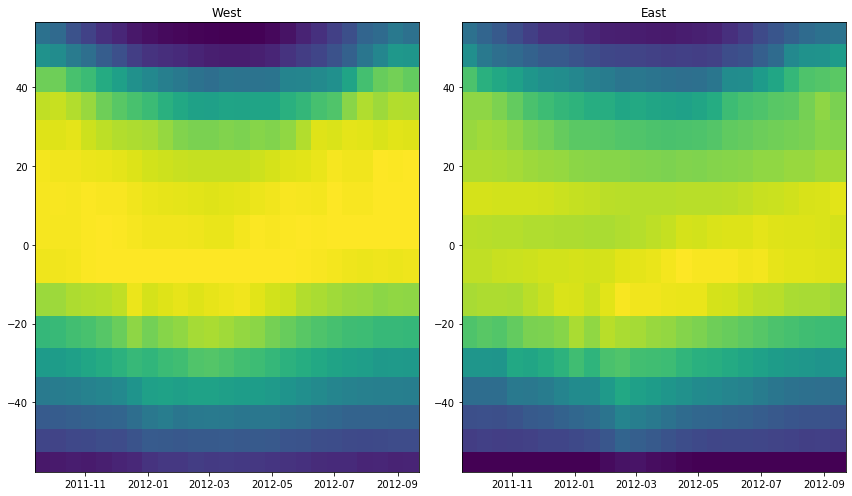

distributed.scheduler - INFO - Retire worker names (131, 132, 133, 119, 121, 122, 95)
distributed.deploy.adaptive - INFO - Retiring workers [131, 132, 133, 119, 121, 122, 95]
distributed.scheduler - INFO - Remove worker tcp://10.32.14.10:37253
distributed.core - INFO - Removing comms to tcp://10.32.14.10:37253
distributed.scheduler - INFO - Remove worker tcp://10.32.13.7:34609
distributed.core - INFO - Removing comms to tcp://10.32.13.7:34609
distributed.scheduler - INFO - Remove worker tcp://10.32.15.5:41913
distributed.core - INFO - Removing comms to tcp://10.32.15.5:41913
distributed.scheduler - INFO - Remove worker tcp://10.32.18.8:42303
distributed.core - INFO - Removing comms to tcp://10.32.18.8:42303
distributed.scheduler - INFO - Retire worker names (123, 124, 125, 126)
distributed.deploy.adaptive - INFO - Retiring workers [123, 124, 125, 126]
distributed.scheduler - INFO - Remove worker tcp://10.32.15.9:45719
distributed.core - INFO - Removing comms to tcp://10.32.15.9:45719
d

In [89]:
# Seasonal cycle of temp
plt.figure(figsize=(12,7))

plt.subplot(121)
plt.pcolormesh(SST_Pac_strip_west_monthly.time,
               YCmean_Pac_strip_coarse, 
               SST_Pac_strip_west_monthly.T, 
              vmin=1.5, vmax=29)
plt.title('West')

plt.subplot(122)
plt.pcolormesh(SST_Pac_strip_east_monthly.time,
               YCmean_Pac_strip_coarse, 
               SST_Pac_strip_east_monthly.T,
              vmin=1.5, vmax=29)
plt.title('East')
plt.tight_layout()

In [91]:
lwindow = 40
SST_Pac_strip_west_ls = (SST_Pac_strip_west.rolling(i=lwindow, center=True).mean()
                   ).rolling(j=lwindow, center=True).mean();
SST_Pac_strip_east_ls = (SST_Pac_strip_east.rolling(i=lwindow, center=True).mean()
                   ).rolling(j=lwindow, center=True).mean();

distributed.core - INFO - Event loop was unresponsive in Scheduler for 6.17s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.


In [93]:
SST_Pac_strip_west_ss = SST_Pac_strip_west - SST_Pac_strip_west_ls
SST_Pac_strip_east_ss = SST_Pac_strip_east - SST_Pac_strip_east_ls

distributed.scheduler - INFO - Retire worker names (155,)
distributed.deploy.adaptive - INFO - Retiring workers [155]


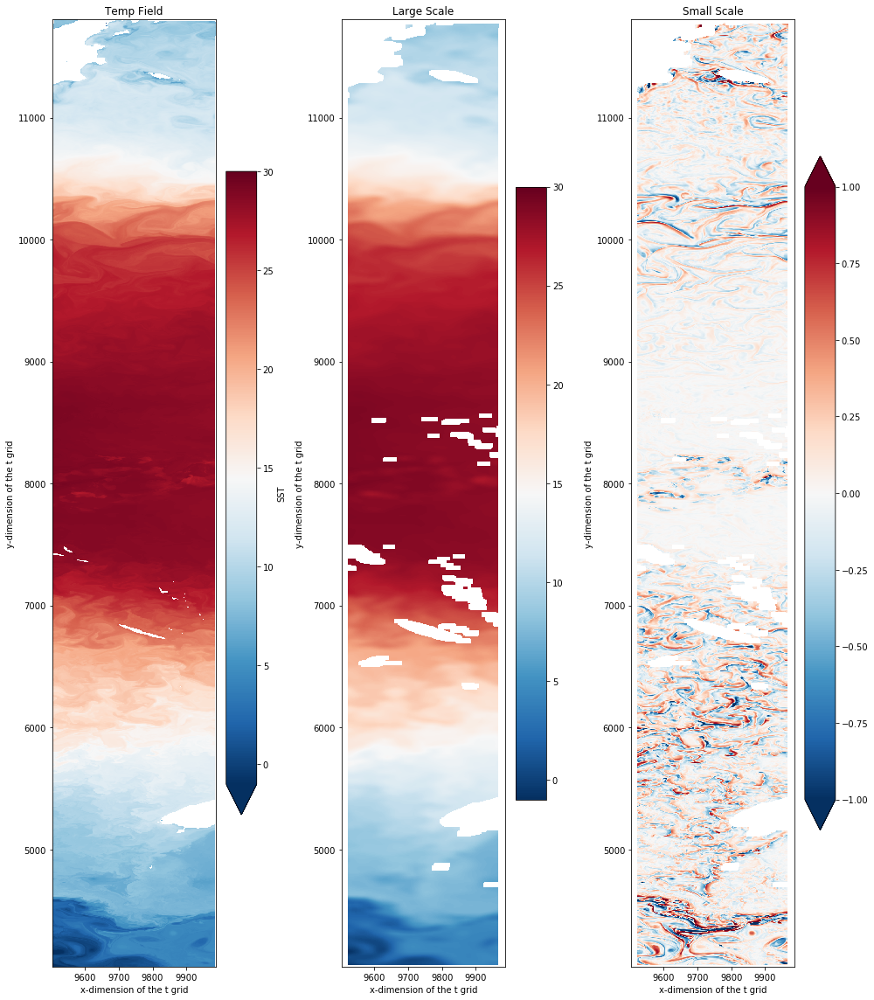

In [95]:
# West Snapshot
plt.figure(figsize=(14,16))
plt.subplot(131)
SST_Pac_strip_west.isel(time=0).plot(vmin=-1, vmax=30, cmap='RdBu_r')
plt.title('Temp Field')

plt.subplot(132)
SST_Pac_strip_west_ls.isel(time=0).plot(vmin=-1, vmax=30, cmap='RdBu_r')
plt.title('Large Scale')

plt.subplot(133)
SST_Pac_strip_west_ss.isel(time=0).plot(vmin=-1, vmax=1, cmap='RdBu_r')
plt.title('Small Scale')
plt.tight_layout()

distributed.scheduler - INFO - Retire worker names (178,)
distributed.deploy.adaptive - INFO - Retiring workers [178]
distributed.scheduler - INFO - Remove worker tcp://10.32.55.16:36429
distributed.core - INFO - Removing comms to tcp://10.32.55.16:36429
distributed.scheduler - INFO - Retire worker names (179, 180, 181, 182, 183, 184, 185, 186)
distributed.deploy.adaptive - INFO - Retiring workers [179, 180, 181, 182, 183, 184, 185, 186]
distributed.scheduler - INFO - Remove worker tcp://10.32.13.15:34255
distributed.core - INFO - Removing comms to tcp://10.32.13.15:34255
distributed.scheduler - INFO - Remove worker tcp://10.32.9.16:41507
distributed.core - INFO - Removing comms to tcp://10.32.9.16:41507
distributed.scheduler - INFO - Remove worker tcp://10.32.15.16:37387
distributed.core - INFO - Removing comms to tcp://10.32.15.16:37387
distributed.scheduler - INFO - Remove worker tcp://10.32.15.17:32823
distributed.core - INFO - Removing comms to tcp://10.32.15.17:32823
distributed.

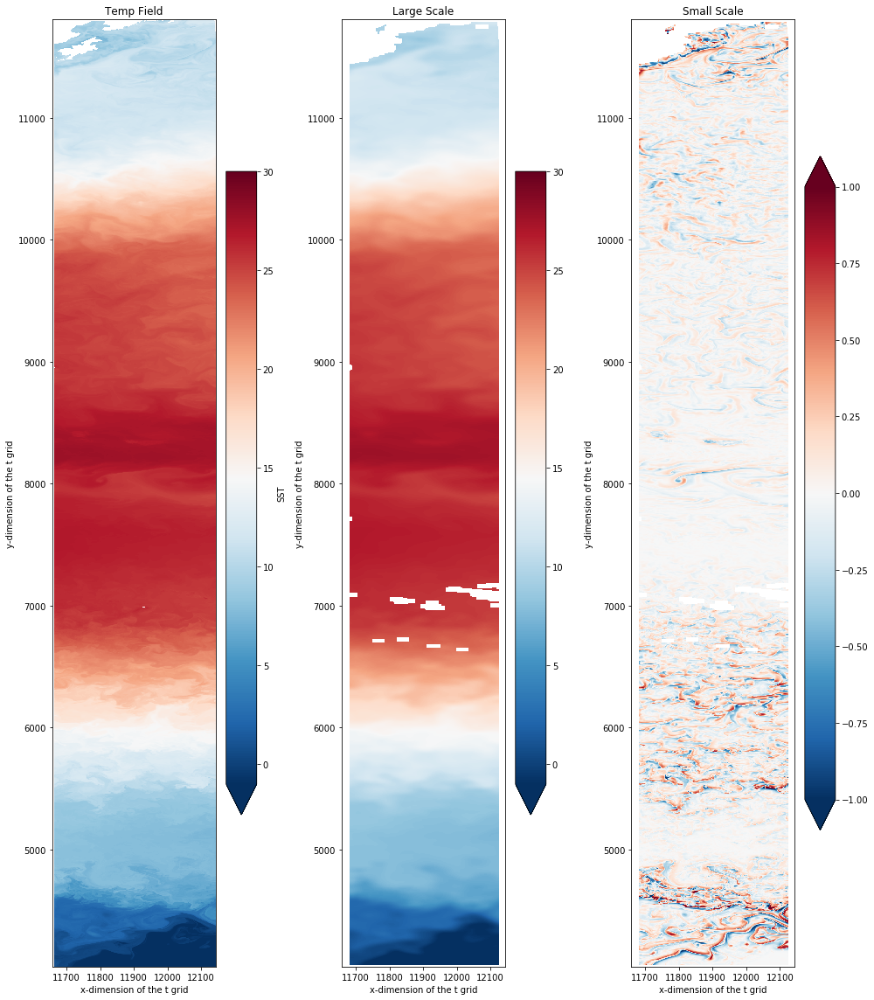

In [99]:
# East Snapshot
plt.figure(figsize=(14,16))
plt.subplot(131)
SST_Pac_strip_east.isel(time=0).plot(vmin=-1, vmax=30, cmap='RdBu_r')
plt.title('Temp Field')

plt.subplot(132)
SST_Pac_strip_east_ls.isel(time=0).plot(vmin=-1, vmax=30, cmap='RdBu_r')
plt.title('Large Scale')

plt.subplot(133)
SST_Pac_strip_east_ss.isel(time=0).plot(vmin=-1, vmax=1, cmap='RdBu_r')
plt.title('Small Scale')
plt.tight_layout()

In [96]:
# estimate the spatial variance 
SST_Pac_strip_west_ss_var = SST_Pac_strip_west_ss.isel(time=slice(0,9030,24*5)
                                ).coarsen(j=450, boundary='trim').std().std(['i'])
SST_Pac_strip_east_ss_var = SST_Pac_strip_east_ss.isel(time=slice(0,9030,24*5)
                                ).coarsen(j=450, boundary='trim').std().std(['i'])

In [97]:
SST_Pac_strip_west_ss_var.load();

distributed.core - INFO - Event loop was unresponsive in Scheduler for 7.67s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
distributed.utils_perf - INFO - full garbage collection released 1.17 GB from 24607 reference cycles (threshold: 10.00 MB)
distributed.core - INFO - Event loop was unresponsive in Scheduler for 10.02s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
distributed.scheduler - INFO - Register tcp://10.32.13.13:39617
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.13.13:39617
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.13.14:46811
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.13.14:46811
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Regis

In [98]:
SST_Pac_strip_east_ss_var.load()

distributed.scheduler - INFO - Retire worker names (161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 157, 158, 159)
distributed.deploy.adaptive - INFO - Retiring workers [161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 157, 158, 159]
distributed.scheduler - INFO - Remove worker tcp://10.32.19.6:44727
distributed.core - INFO - Removing comms to tcp://10.32.19.6:44727
distributed.scheduler - INFO - Remove worker tcp://10.32.9.15:34869
distributed.core - INFO - Removing comms to tcp://10.32.9.15:34869
distributed.scheduler - INFO - Remove worker tcp://10.32.22.22:46761
distributed.core - INFO - Removing comms to tcp://10.32.22.22:46761
distributed.scheduler - INFO - Remove worker tcp://10.32.23.30:36637
distributed.core - INFO - Removing comms to tcp://10.32.23.30:36637
distributed.scheduler - INFO - Remove worker tcp://10.32.18.12:45493
distributed.core - INFO - Removing comms to tcp://10.32.18.12:45493
distributed.scheduler - INFO - Remove worker tcp://1

<xarray.DataArray (time: 76, j: 17)>
array([[0.05914564, 0.04137672, 0.03093934, ..., 0.03153371, 0.01250588,
        0.04173396],
       [0.06831938, 0.04348837, 0.03158797, ..., 0.03835641, 0.01522458,
        0.03444403],
       [0.07317435, 0.05281757, 0.03150348, ..., 0.03197291, 0.01692528,
        0.0451012 ],
       ...,
       [0.0882846 , 0.05740067, 0.01983249, ..., 0.01964539, 0.02058428,
        0.04936986],
       [0.09686138, 0.0766385 , 0.01779399, ..., 0.02015557, 0.01668266,
        0.04641195],
       [0.0944133 , 0.08059709, 0.01830976, ..., 0.01834803, 0.01083149,
        0.04048503]], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 2011-09-13 2011-09-18 ... 2012-09-22
  * j        (j) float64 4.264e+03 4.714e+03 5.164e+03 ... 1.101e+04 1.146e+04

distributed.scheduler - INFO - Register tcp://10.32.43.17:37031
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.43.17:37031
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.13.13:43939
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.13.13:43939
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.24.13:40735
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.24.13:40735
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.45.8:42545
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.45.8:42545
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.9.16:44193
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.9.16:44193
distributed.core 

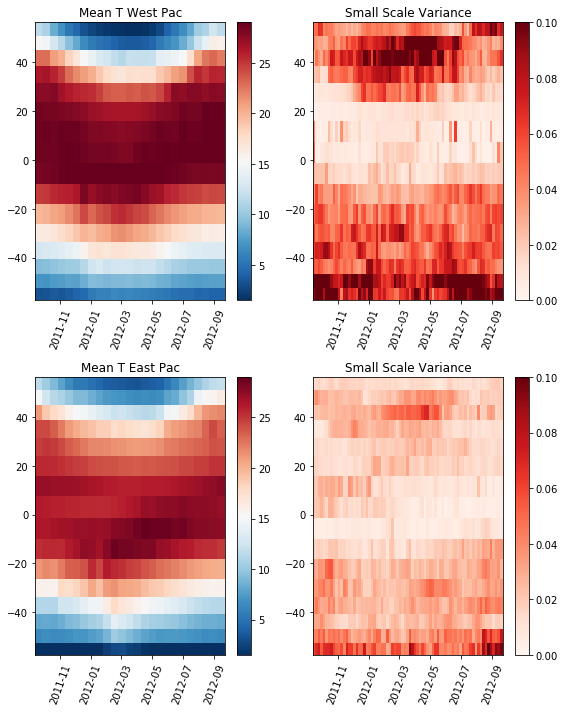

In [132]:
plt.figure(figsize=(8,10))

plt.subplot(221)
plt.pcolormesh(SST_Pac_strip_west_monthly.time,
               YCmean_Atl_strip_coarse, 
               SST_Pac_strip_west_monthly.T,
              vmin=1.5, vmax=29, cmap='RdBu_r')
plt.xticks(rotation=70)
plt.colorbar()
plt.title('Mean T West Pac')
#(SST_Pac_strip_west_monthly.T).plot.contourf(levels=20)

plt.subplot(222)
plt.pcolormesh(SST_Pac_strip_west_ss_var.time,
               YCmean_Atl_strip_coarse, 
               SST_Pac_strip_west_ss_var.T,
              vmin=0, vmax=0.1, cmap='Reds')
plt.xticks(rotation=70)
plt.colorbar()
plt.title('Small Scale Variance')
#SST_Pac_small_scale_var_west.T.plot(vmax=0.3, cmap='Reds')

plt.subplot(223)
plt.pcolormesh(SST_Pac_strip_east_monthly.time,
              YCmean_Atl_strip_coarse, 
               SST_Pac_strip_east_monthly.T,
              vmin=1.5, vmax=29, cmap='RdBu_r')
plt.xticks(rotation=70)
plt.colorbar()
plt.title('Mean T East Pac')
#(SST_Pac_strip_west_monthly.T).plot.contourf(levels=20)

plt.subplot(224)
plt.pcolormesh(SST_Pac_strip_east_ss_var.time,
               YCmean_Pac_strip_coarse, 
               SST_Pac_strip_east_ss_var.T,
              vmin=0, vmax=0.1, cmap='Reds')
plt.xticks(rotation=70)
plt.colorbar()
plt.title('Small Scale Variance')

plt.tight_layout()
plt.savefig('pac.png')

# Atlantic
x_atl_east, y_atl_east = [-30, -20, -20, -30, -30], [-60, -60, 60, 60, -60]  
x_atl_west, y_atl_west = [-65, -55, -55, -65, -65], [-60, -60, 60, 60, -60]


In [108]:
sel_Atl_strip_west = np.logical_and(np.logical_and(coords.XC>-30, coords.XC<-20 ),
                           np.logical_and(coords.YC>-60, coords.YC<60 ))
sel_Atl_strip_east = np.logical_and(np.logical_and(coords.XC>-65, coords.XC<-55 ),
                           np.logical_and(coords.YC>-60, coords.YC<60 ))

In [109]:
# Pacific Strip 
SST_Atl_strip_west = ds.SST.where(sel_Atl_strip_west, drop=True)
SST_Atl_strip_east = ds.SST.where(sel_Atl_strip_east, drop=True)

distributed.scheduler - INFO - Retire worker names (323,)
distributed.deploy.adaptive - INFO - Retiring workers [323]
distributed.scheduler - INFO - Retire worker names (324,)
distributed.deploy.adaptive - INFO - Retiring workers [324]
distributed.scheduler - INFO - Register tcp://10.32.23.47:37313
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.23.47:37313
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Retire worker names (325,)
distributed.deploy.adaptive - INFO - Retiring workers [325]
distributed.scheduler - INFO - Retire worker names (325,)
distributed.deploy.adaptive - INFO - Retiring workers [325]
distributed.scheduler - INFO - Retire worker names (326,)
distributed.deploy.adaptive - INFO - Retiring workers [326]


In [110]:
YCmean_Atl_strip_coarse = coords.YC.where(sel_Atl_strip_west, drop=True
                                         ).coarsen(j=450, boundary='trim').mean().mean(['i'])

distributed.scheduler - INFO - Retire worker names (287,)
distributed.deploy.adaptive - INFO - Retiring workers [287]
distributed.scheduler - INFO - Remove worker tcp://10.32.22.31:41695
distributed.core - INFO - Removing comms to tcp://10.32.22.31:41695
distributed.scheduler - INFO - Remove worker tcp://10.32.23.47:37313
distributed.core - INFO - Removing comms to tcp://10.32.23.47:37313
distributed.scheduler - INFO - Lost all workers
distributed.scheduler - INFO - Retire worker names (326,)
distributed.deploy.adaptive - INFO - Retiring workers [326]
distributed.scheduler - INFO - Register tcp://10.32.21.4:44923
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.21.4:44923
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Retire worker names (328,)
distributed.deploy.adaptive - INFO - Retiring workers [328]
distributed.scheduler - INFO - Register tcp://10.32.15.3:45049
distributed.scheduler - INFO - Starting worker compute

In [111]:
YCmean_Atl_strip_coarse.load()

<xarray.DataArray (j: 17)>
array([-57.593563 , -52.436527 , -46.722225 , -40.411068 , -33.50311  ,
       -26.028343 , -18.053455 ,  -9.684051 ,  -1.0619241,   7.5935664,
        16.039183 ,  24.12173  ,  31.72638  ,  38.776978 ,  45.235065 ,
        51.093918 ,  56.364105 ], dtype=float32)
Coordinates:
  * j        (j) float64 4.264e+03 4.714e+03 5.164e+03 ... 1.101e+04 1.146e+04

In [113]:
SST_Atl_strip_west_monthly = SST_Atl_strip_west.isel(
    time=slice(0,9030,15*24)).coarsen(j=450, boundary='trim').mean().mean(['i'])
SST_Atl_strip_east_monthly = SST_Atl_strip_east.isel(
    time=slice(0,9030,15*24)).coarsen(j=450, boundary='trim').mean().mean(['i'])

In [114]:
SST_Atl_strip_west_monthly.load();
SST_Atl_strip_east_monthly.load();

distributed.scheduler - INFO - Retire worker names (329, 330, 331, 327)
distributed.deploy.adaptive - INFO - Retiring workers [329, 330, 331, 327]
distributed.scheduler - INFO - Remove worker tcp://10.32.21.4:44923
distributed.core - INFO - Removing comms to tcp://10.32.21.4:44923
distributed.scheduler - INFO - Lost all workers
distributed.scheduler - INFO - Register tcp://10.32.15.4:34165
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.15.4:34165
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.15.5:45317
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.15.5:45317
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.22.32:44649
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.22.32:44649
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://1

In [116]:
lwindow = 40
SST_Atl_strip_west_ls = (SST_Atl_strip_west.rolling(i=lwindow, center=True).mean()
                   ).rolling(j=lwindow, center=True).mean();
SST_Atl_strip_east_ls = (SST_Atl_strip_east.rolling(i=lwindow, center=True).mean()
                   ).rolling(j=lwindow, center=True).mean();

distributed.core - INFO - Event loop was unresponsive in Scheduler for 9.62s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
distributed.core - INFO - Event loop was unresponsive in Scheduler for 12.50s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)


In [118]:
SST_Atl_strip_west_ss = SST_Atl_strip_west - SST_Atl_strip_west_ls
SST_Atl_strip_east_ss = SST_Atl_strip_east - SST_Atl_strip_east_ls

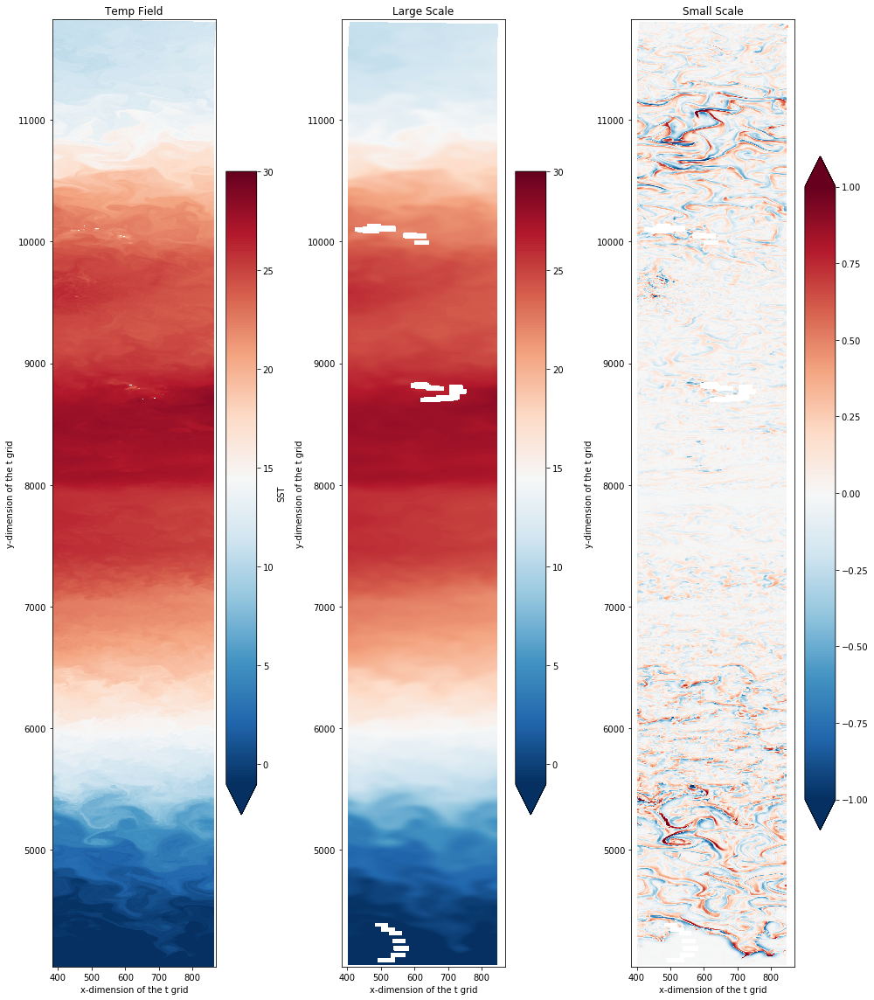

In [119]:
# West Natl Snapshot
plt.figure(figsize=(14,16))
plt.subplot(131)
SST_Atl_strip_west.isel(time=0).plot(vmin=-1, vmax=30, cmap='RdBu_r')
plt.title('Temp Field')

plt.subplot(132)
SST_Atl_strip_west_ls.isel(time=0).plot(vmin=-1, vmax=30, cmap='RdBu_r')
plt.title('Large Scale')

plt.subplot(133)
SST_Atl_strip_west_ss.isel(time=0).plot(vmin=-1, vmax=1, cmap='RdBu_r')
plt.title('Small Scale')
plt.tight_layout()

distributed.core - INFO - Event loop was unresponsive in Scheduler for 13.98s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)
distributed.utils_perf - INFO - full garbage collection released 908.76 MB from 23245 reference cycles (threshold: 10.00 MB)


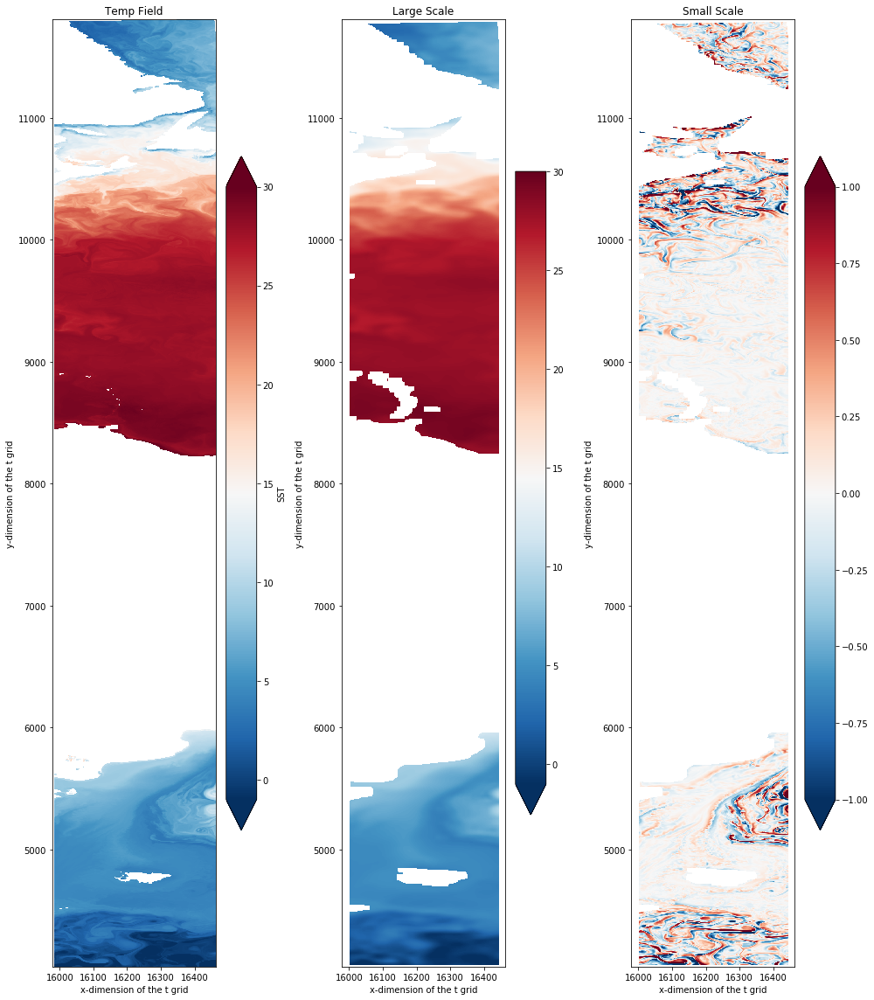

In [120]:
# East Natl Snapshot
plt.figure(figsize=(14,16))
plt.subplot(131)
SST_Atl_strip_east.isel(time=0).plot(vmin=-1, vmax=30, cmap='RdBu_r')
plt.title('Temp Field')

plt.subplot(132)
SST_Atl_strip_east_ls.isel(time=0).plot(vmin=-1, vmax=30, cmap='RdBu_r')
plt.title('Large Scale')

plt.subplot(133)
SST_Atl_strip_east_ss.isel(time=0).plot(vmin=-1, vmax=1, cmap='RdBu_r')
plt.title('Small Scale')
plt.tight_layout()

In [121]:
# estimate the spatial variance 
SST_Atl_strip_west_ss_var = SST_Atl_strip_west_ss.isel(time=slice(0,9030,24*5)
                                ).coarsen(j=450, boundary='trim').std().std(['i'])
SST_Atl_strip_east_ss_var = SST_Atl_strip_east_ss.isel(time=slice(0,9030,24*5)
                                ).coarsen(j=450, boundary='trim').std().std(['i'])

In [122]:
SST_Atl_strip_west_ss_var.load();

distributed.core - INFO - Event loop was unresponsive in Scheduler for 9.79s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
distributed.scheduler - INFO - Register tcp://10.32.13.6:34285
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.13.6:34285
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.13.7:36527
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.13.7:36527
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.14.10:40765
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.14.10:40765
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.22.33:44431
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.22.33:44431
distributed.cor

In [123]:
SST_Atl_strip_east_ss_var.load();

distributed.scheduler - INFO - Retire worker names (388, 389, 370, 371, 372)
distributed.deploy.adaptive - INFO - Retiring workers [388, 389, 370, 371, 372]
distributed.scheduler - INFO - Remove worker tcp://10.32.24.9:45745
distributed.core - INFO - Removing comms to tcp://10.32.24.9:45745
distributed.scheduler - INFO - Remove worker tcp://10.32.20.7:37325
distributed.core - INFO - Removing comms to tcp://10.32.20.7:37325
distributed.scheduler - INFO - Remove worker tcp://10.32.23.50:33993
distributed.core - INFO - Removing comms to tcp://10.32.23.50:33993
distributed.scheduler - INFO - Remove worker tcp://10.32.21.10:43301
distributed.core - INFO - Removing comms to tcp://10.32.21.10:43301
distributed.scheduler - INFO - Remove worker tcp://10.32.13.8:33505
distributed.core - INFO - Removing comms to tcp://10.32.13.8:33505
distributed.scheduler - INFO - Retire worker names (373, 374, 375, 376, 377, 378, 379, 380, 381, 382)
distributed.deploy.adaptive - INFO - Retiring workers [373, 37

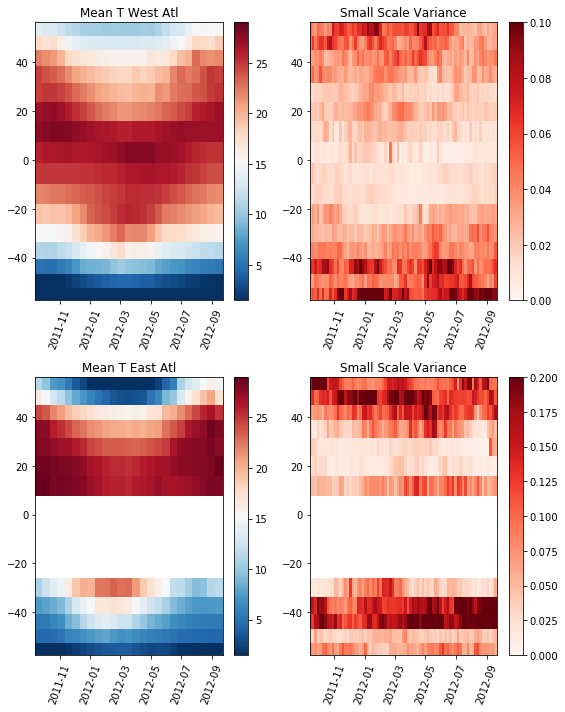

In [130]:
plt.figure(figsize=(8,10))

plt.subplot(221)
plt.pcolormesh(SST_Atl_strip_west_monthly.time,
               YCmean_Atl_strip_coarse, 
               SST_Atl_strip_west_monthly.T,
              vmin=1.5, vmax=29, cmap='RdBu_r')
plt.xticks(rotation=70)
plt.colorbar()
plt.title('Mean T West Atl')
#(SST_Pac_strip_west_monthly.T).plot.contourf(levels=20)

plt.subplot(222)
plt.pcolormesh(SST_Atl_strip_west_ss_var.time,
               YCmean_Atl_strip_coarse, 
               SST_Atl_strip_west_ss_var.T,
              vmin=0, vmax=0.1, cmap='Reds')
plt.xticks(rotation=70)
plt.colorbar()
plt.title('Small Scale Variance')
#SST_Pac_small_scale_var_west.T.plot(vmax=0.3, cmap='Reds')

plt.subplot(223)
plt.pcolormesh(SST_Atl_strip_east_monthly.time,
              YCmean_Atl_strip_coarse, 
               SST_Atl_strip_east_monthly.T,
              vmin=1.5, vmax=29, cmap='RdBu_r')
plt.xticks(rotation=70)
plt.colorbar()
plt.title('Mean T East Atl')
#(SST_Pac_strip_west_monthly.T).plot.contourf(levels=20)

plt.subplot(224)
plt.pcolormesh(SST_Atl_strip_east_ss_var.time,
               YCmean_Atl_strip_coarse, 
               SST_Atl_strip_east_ss_var.T,
              vmin=0, vmax=0.2, cmap='Reds')
plt.xticks(rotation=70)
plt.colorbar()
plt.title('Small Scale Variance')

plt.tight_layout()

plt.savefig('atl.png')